In [4]:
import scanpy as sc
# Import MANA functions
import sys
sys.path.insert(0, '..')
from utils import aggregate_neighbors_weighted, plot_spatial_compact_fast

In [2]:
ad = sc.read_h5ad('/Volumes/processing2/RRmap/data/EAE_MANA_annotated_gmm_clust_with_scores.h5ad')

In [6]:
# Run MANA with optimal parameters from MANA-6 benchmarking
# Using gaussian kernel (winner from benchmark)
# IMPORTANT: Use sample_key for memory-efficient per-sample processing!

# First, reload the module to get the updated code
import importlib
import sys
if 'utils.aggregate_neighbors_weighted' in sys.modules:
    importlib.reload(sys.modules['utils.aggregate_neighbors_weighted'])
from utils.aggregate_neighbors_weighted import aggregate_neighbors_weighted


In [9]:
# Run MANA with memory-efficient per-sample processing
# Adjust 'sample_key' to match your actual sample column name!

aggregate_neighbors_weighted(
    ad,
    n_layers=2,              # Optimal balance (from MANA-5)
    aggregations='mean',     # Standard aggregation
    use_rep='X_scVI',        # Use scVI latent space
    out_key='X_mana_gauss_2neigh',  # Output key
    hop_decay=0.2,           # Optimal decay (from MANA-4)
    distance_kernel='gaussian',  # Winner from MANA-6 benchmark
    spatial_key='spatial',
    normalize_weights=True,
    include_self=True,
    sample_key='sample_id',  # CRITICAL: Process per-sample to avoid memory issues!
)

print("\nMANA aggregation complete!")
print(f"Output stored in adata.obsm['X_mana_gauss'] with shape: {ad.obsm['X_mana_gauss'].shape}")

Processing 107 samples separately for memory efficiency...
  Processing sample 1/107: G3_L1_0 (10,909 cells)
  Processing sample 2/107: G3_L1_1 (19,257 cells)
  Processing sample 3/107: G3_L1_2 (7,392 cells)
  Processing sample 4/107: G3_L2_0 (9,715 cells)
  Processing sample 5/107: G3_L2_1 (11,650 cells)
  Processing sample 6/107: G3_L2_2 (4,993 cells)
  Processing sample 7/107: G3_L3_0 (13,378 cells)
  Processing sample 8/107: G3_L3_1 (8,085 cells)
  Processing sample 9/107: G3_L3_2 (5,570 cells)
  Processing sample 10/107: G4_L1_0 (4,419 cells)
  Processing sample 11/107: G4_L1_1 (6,364 cells)
  Processing sample 12/107: G4_L1_2 (12,048 cells)
  Processing sample 13/107: G4_L2_0 (10,094 cells)
  Processing sample 14/107: G4_L2_1 (8,493 cells)
  Processing sample 15/107: G4_L2_2 (5,998 cells)
  Processing sample 16/107: G4_L3_0 (6,918 cells)
  Processing sample 17/107: G4_L3_1 (11,613 cells)
  Processing sample 18/107: G4_L3_2 (6,617 cells)
  Processing sample 19/107: G5_L1_0 (3,044 

In [ ]:
# Build neighborhood graph in MANA feature space
sc.pp.neighbors(
    ad,
    use_rep='X_mana_gauss_2neigh',
    n_neighbors=15,
    key_added='mana'
)

print("Neighbor graph built in MANA feature space")

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [ ]:
# Leiden clustering
# Try a few resolutions to see what works best
resolutions = [0.5,1]

for res in resolutions:
    sc.tl.leiden(
        ad,
        resolution=res,
        key_added=f'leiden_mana_{res}',
        neighbors_key='mana'
    )
    n_clusters = ad.obs[f'leiden_mana_{res}'].nunique()
    print(f"Resolution {res}: {n_clusters} clusters")

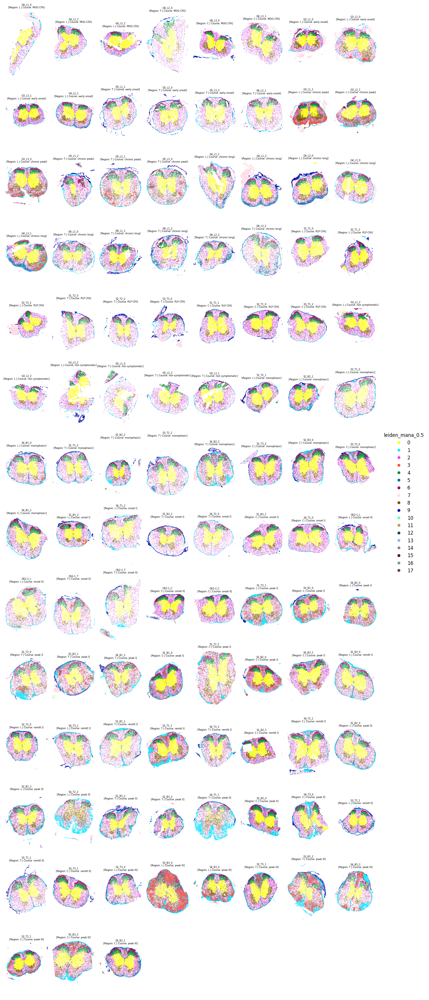

In [35]:
# Visualize MANA clustering (resolution 0.5 as starting point)
plot_spatial_compact_fast(
    ad,
    color='leiden_mana_0.5',
    groupby='sample_id',  # Adjust to your actual sample column
    spot_size = 0.5,
    cols=8,
    height=30,
    background='white',
    dpi=120
)

/Users/christoffer/miniconda3/envs/cellcharter-env-new/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/Users/christoffer/miniconda3/envs/cellcharter-env-new/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/Users/christoffer/miniconda3/envs/cellcharter-env-new/lib/python3.12/s

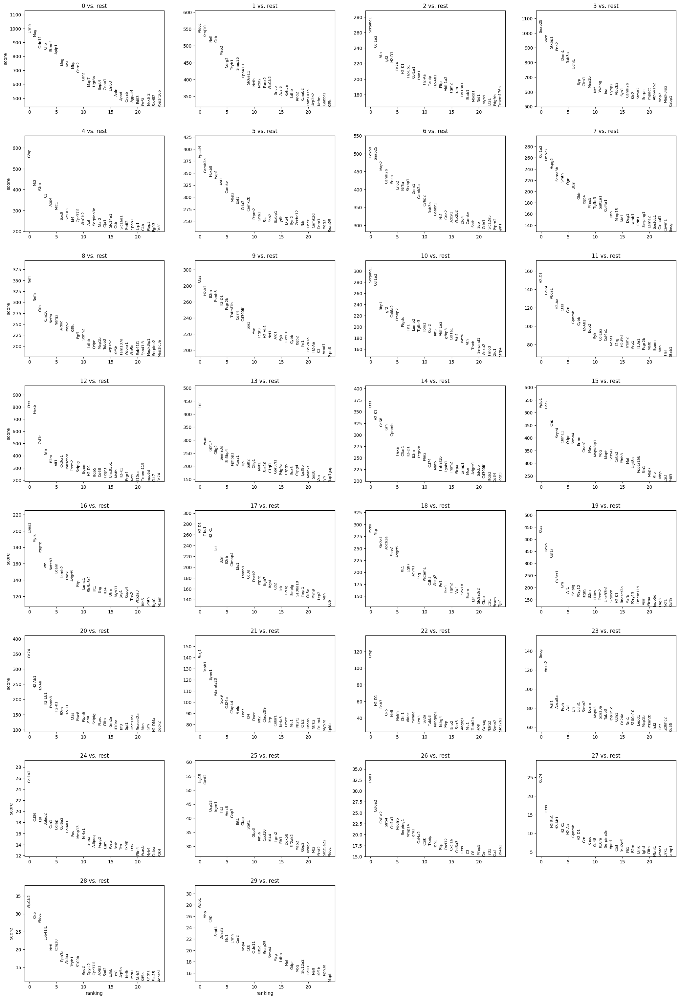

0
Ermn Mag Cldn11 Cnp Stmn4 Aplp1 Mog Mal Mbp Cntn2 Car2 Map7 Ugt8a Sept4 Gnao1 Efnb3 Anln Apod Cryab Agpat4 Edil3 Prr5l Nkx6-2 Sez6l2 Ppp1r16b Klk6 Pllp Sept8 Mapt Sv2a
 
1
Aldoc Kcnj10 Nefl Ckb Map2 Ndrg2 Ttyh1 Snap25 Epb41l1 Slc6a11 Nefh Ntsr2 Panx2 Atp1b2 Sncb Acsl6 Rph3a Ldhb Rnd2 Kcnab2 Fam107a Atp2b2 Nefm Gabbr1 Kif5c Fgfr3 Stxbp1 Limk1 Mlc1 Gprc5b
 
2
Serping1 Col1a2 Vtn Igf2 H2-D1 Cd74 H2-K1 H2-Eb1 Col1a1 Fbln1 H2-Aa Txnip H2-Ab1 Pltp Aldh1a2 Tgm2 Lum Col18a1 Stab1 Moxd1 Nid1 Myh9 Ets1 Pdgfrb Tmem176a Hspg2 Cxcl16 Sfrp4 Rbp1 Flna
 
3
Snap25 Sncb Stxbp1 Eno2 Dnm1 Rab3a Uchl1 Syp Glra1 Map1b Nsf Ywhag Ina Cyfip2 Atp2b2 Syn1 Camk2b Klc2 Stmn2 Snrpn Impact Atp6v1b2 Map2 Mapk8ip2 Cabp1 Kif5a Ndrg4 Sv2a Grin1 Ldhb
 
4
Gfap Mt2 A2m C3 Aqp4 Mlc1 Sox9 Slc1a3 Id4 Gpr37l1 Atp1b2 Agt Serpina3n Ntsr2 Gja1 Slc14a1 Ckb Slc16a1 Padi2 Spon1 Lrp1 C4b Plpp3 Fgfr3 Cd81 Fabp7 Prelp Thbs2 Ntrk2 Ttyh1
 
5
Hpcal4 Camk2a Hoxb8 Hap1 Ahi1 Camkv Map2 Ebf3 Gria2 Camk2b Ptprn2 Gria1 Sst Eno2 Stxbp1 Ly6h Dl

In [47]:
import pandas as pd
key = "leiden_mana_1.0"              # <-- change to your cluster column

sc.tl.rank_genes_groups(
    ad,
    groupby=key,
    reference="rest",             # each group vs all other cells
    method="t-test",
    pts=True,                     # add fraction expressing
)
sc.pl.rank_genes_groups(ad, n_genes=25, sharey=False)

marker_genes = pd.DataFrame({
    group: ad.uns['rank_genes_groups']['names'][group][:30]
    for group in ad.uns['rank_genes_groups']['names'].dtype.names
})
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

In [43]:
# Compare leiden_mana_0.5 clusters to anno_L2 labels
import pandas as pd
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from IPython.display import display

cluster_key = 'leiden_mana_1.0'
label_key = 'anno_L2'

if cluster_key not in ad.obs or label_key not in ad.obs:
    raise KeyError(f"Missing columns in ad.obs: {cluster_key!r} or {label_key!r}")

clusters = ad.obs[cluster_key].astype('category')
labels = ad.obs[label_key].astype('category')

ari = adjusted_rand_score(labels, clusters)
nmi = normalized_mutual_info_score(labels, clusters)

ct = pd.crosstab(clusters, labels)
purity = ct.max(axis=1).sum() / ct.values.sum()

print(f'ARI: {ari:.4f}')
print(f'NMI: {nmi:.4f}')
print(f'Purity: {purity:.4f}')

display(ct)

dominant = ct.idxmax(axis=1)
dominant_frac = ct.max(axis=1) / ct.sum(axis=1)
summary = pd.DataFrame({
    'dominant_label': dominant,
    'dominant_frac': dominant_frac,
    'n_cells': ct.sum(axis=1),
}).sort_values('n_cells', ascending=False)

display(summary)


ARI: 0.3073
NMI: 0.4950
Purity: 0.6136


anno_L2,Arachnoid barrier,Artifact,Astrocyte,B cell,BAM,Dendritic cell,Endothelial,Interneuron,Macrophage,Meningeal fibroblast,...,Monocyte-derived,Neuron,OPC,Oligodendrocyte,Other,Pericyte,Perineurial,Schwann cell,T cell,VSMC
leiden_mana_1.0,,,,,,,,,,,,,,,,,,,,,
0,6,1369,7514,7,5,11,239,195,150,76,...,23,39,434,93116,0,32,0,9,114,4
1,1,231,21630,3,2,29,15468,8207,27,6,...,27,896,172,24248,5,233,0,0,9,173
2,718,1626,311,8789,6954,4109,13667,86,4397,10992,...,963,10,31,121,1,97,92,66,9317,107
3,0,76,757,1,0,7,625,37406,3,2,...,7,17566,149,4086,145,78,0,0,4,18
4,33,1245,42746,72,1078,82,442,177,357,2336,...,35,7,326,1009,12,19,23,12,415,15
5,2,459,5758,4,5,17,2855,36660,124,27,...,20,611,1515,4259,0,85,1,1,33,15
6,0,183,7202,1,8,7,3040,42551,21,5,...,16,686,159,1123,0,69,0,0,10,27
7,1946,567,157,72,1042,125,1105,70,1330,3921,...,287,131,16,57,0,224,7115,24354,562,86
8,5,238,7014,1,23,45,2767,1238,188,6,...,42,15328,565,7346,0,165,0,0,97,145


,dominant_label,dominant_frac,n_cells
leiden_mana_1.0,,,
0,Oligodendrocyte,0.893825,104177
1,Oligodendrocyte,0.331642,73115
2,Endothelial,0.210657,64878
3,Interneuron,0.605383,61789
4,Astrocyte,0.730152,58544
5,Interneuron,0.654795,55987
6,Interneuron,0.763082,55762
7,Schwann cell,0.557274,43702
8,Neuron,0.383133,40007


In [ ]:
for cluster in ad.obs['leiden_mana_1.0'].cat.categories.tolist():
    print(f"Visualizing cluster {cluster}")
    # Visualize MANA clustering (resolution 0.5 as starting point)
    genes = marker_genes[cluster].tolist()
    print(" ".join(genes))
    print(' ')
    plot_spatial_compact_fast(
        ad,
        color='leiden_mana_1.0',
        groupby='sample_id',  # Adjust to your actual sample column
        spot_size = 0.5,
        cols=8,
        height=30,
        background='white',
        dpi=120,
        highlight = [cluster],
    )

In [91]:
cluster_to_compartment = {
    "0":  "white matter",
    "1":  "grey matter",
    "2":  "vasculature",
    "3":  "grey matter",
    "4":  "lesion (reactive glia)",
    "5":  "dorsal horn",
    "6":  "dorsal horn",
    "7":  "dorsal root ganglion",
    "8":  "grey matter",
    "9":  "lesion (APC)",
    "10": "vasculature",
    "11": "lesion (lipid/ECM macrophage)",
    "12": "lesion (activated microglia)",
    "13": "OPC/pre-OPC",
    "14": "lesion (Foamy-lipid droplet)",
    "15": "grey matter",
    "16": "vasculature",
    "17": "lesion (T cell nodules)",
    "18": "vasculature",
    "19": "grey matter",
    "20": "lesion (APC)",
    "21": "central canal",
    "22": "grey matter",
    "23": "dorsal root ganglion",
    "24": "dorsal root ganglion",
    "25": "grey matter",
    "26": "lesion",
    "27": "lesion",
    "28": "grey matter",
    "29": "unknown",
}

In [92]:
key = "leiden_mana_1.0"

ad.obs["compartment_mana"] = (
    ad.obs[key]
      .astype(str)
      .map(cluster_to_compartment)
      .astype("category")
)

In [93]:
del ad.uns['compartment_mana_colors']

In [94]:
compartment_colors = {
    # =====================
    # NORMAL ANATOMY
    # =====================
    "grey matter":        "#4C72B0",  # muted blue
    "white matter":       "#55A868",  # muted green
    "vasculature":        "#8172B2",  # purple
    "central canal":      "#64B5CD",  # cyan/teal
    "dorsal horn":        "#5DA5DA",  # light blue
    "dorsal root ganglion": "#F28E2B",  # orange

    # =====================
    # OLIGO LINEAGE
    # =====================
    "OPC/pre-OPC":        "#2CA02C",  # bright green

    # =====================
    # LESION CORE / IMMUNE
    # =====================
    "lesion":             "#C44E52",  # red
    "lesion (APC)":       "#8C564B",  # brown-red
    "lesion (T cell nodules)": "#E15759",  # strong red
    "lesion (activated microglia)": "#B07AA1",  # purple-pink
    "lesion (lipid/ECM macrophage)": "#CC79A7",  # magenta
    "lesion (Foamy-lipid droplet)": "#D62728",  # dark red

    # =====================
    # REACTIVE GLIA
    # =====================
    "lesion (reactive glia)": "#EDC948",  # yellow-gold

    # =====================
    # MISC
    # =====================
    "unknown":            "#9E9E9E",  # grey
}

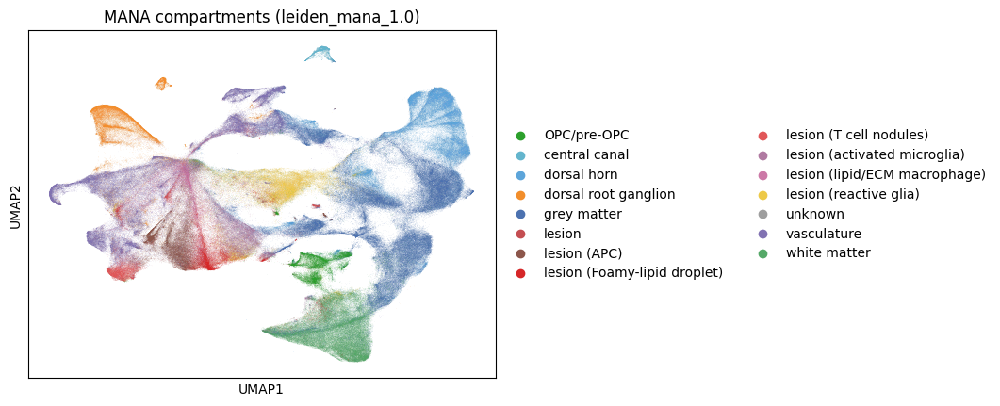

In [95]:
sc.pl.umap(
    ad,
    color='compartment_mana',
    palette=compartment_colors,
    title='MANA compartments (leiden_mana_1.0)',
)   

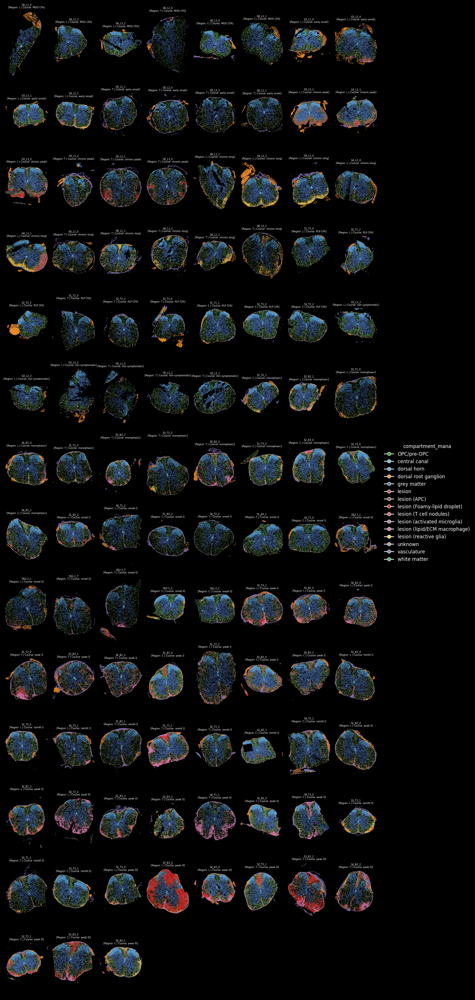

In [97]:
plot_spatial_compact_fast(
    ad,
    color='compartment_mana',
    groupby='sample_id',  # Adjust to your actual sample column
    spot_size = 0.5,
    cols=8,
    height=30,
    background='black',
    dpi=120,
    #highlight = ['9','11','12','14','17','20'],
)

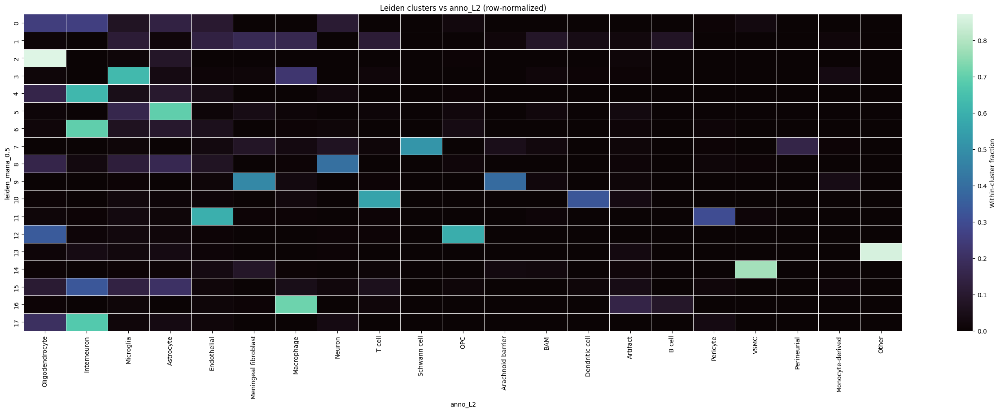

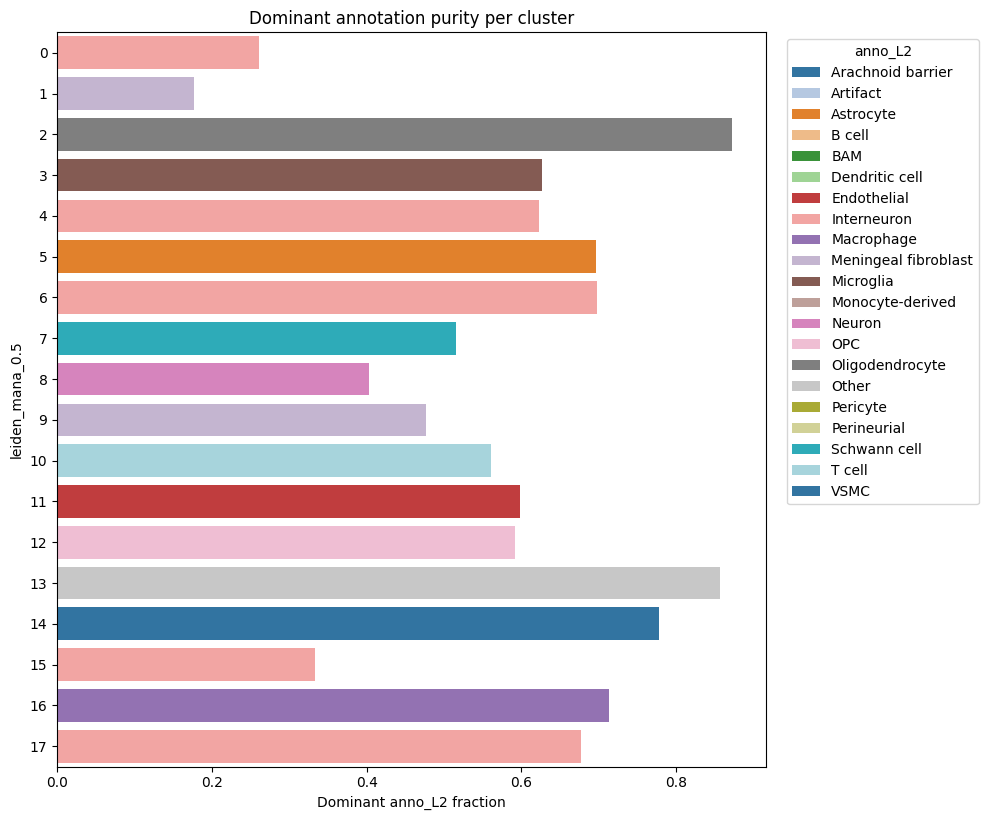

In [51]:
# Visualize cluster vs annotation overlap
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

cluster_key = 'leiden_mana_0.5'
label_key = 'anno_L2'

clusters = ad.obs[cluster_key].astype('category')
labels = ad.obs[label_key].astype('category')

ct = pd.crosstab(clusters, labels)
ct_norm = ct.div(ct.sum(axis=1), axis=0)

# Order clusters by size and annotations by total frequency
cluster_order = ct.sum(axis=1).sort_values(ascending=False).index
label_order = ct.sum(axis=0).sort_values(ascending=False).index
ct_norm = ct_norm.loc[cluster_order, label_order]

plt.figure(figsize=(1.2 * len(label_order), 0.35 * len(cluster_order) + 3))
ax = sns.heatmap(
    ct_norm,
    cmap='mako',
    linewidths=0.5,
    linecolor='white',
    cbar_kws={'label': 'Within-cluster fraction'}
)
ax.set_xlabel(label_key)
ax.set_ylabel(cluster_key)
ax.set_title('Leiden clusters vs anno_L2 (row-normalized)')
plt.tight_layout()
plt.show()

# Optionally highlight dominant label per cluster
dominant = ct_norm.idxmax(axis=1)
dominant_frac = ct_norm.max(axis=1)
plt.figure(figsize=(10, 0.35 * len(cluster_order) + 2))
ax = sns.barplot(
    x=dominant_frac.loc[cluster_order].values,
    y=cluster_order,
    hue=dominant.loc[cluster_order].values,
    dodge=False,
    palette='tab20'
)
ax.set_xlabel('Dominant anno_L2 fraction')
ax.set_ylabel(cluster_key)
ax.set_title('Dominant annotation purity per cluster')
ax.legend(title=label_key, bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()


<Figure size 1680x600 with 0 Axes>

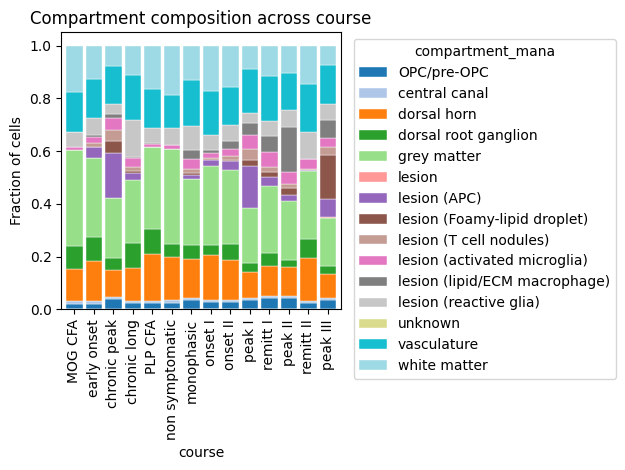

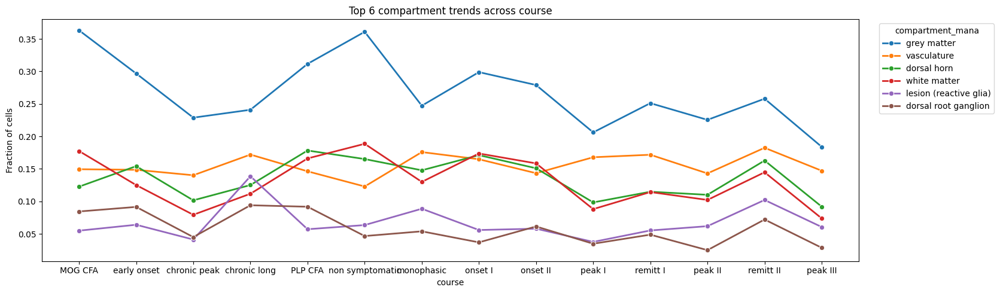

In [98]:
# Compartment dynamics across course
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

course_key = 'course'
comp_key = 'compartment_mana'

if course_key not in ad.obs or comp_key not in ad.obs:
    raise KeyError(f"Missing columns in ad.obs: {course_key!r} or {comp_key!r}")

df = ad.obs[[course_key, comp_key]].copy()
df[course_key] = df[course_key].astype('category')
df[comp_key] = df[comp_key].astype('category')

# Order courses by category order if set, otherwise by sorted unique
course_order = (list(df[course_key].cat.categories)
                if df[course_key].cat.ordered
                else sorted(df[course_key].unique()))

# Composition per course
ct = pd.crosstab(df[course_key], df[comp_key]).loc[course_order]
ct_prop = ct.div(ct.sum(axis=1), axis=0)

plt.figure(figsize=(1.2 * len(course_order), 6))
ax = ct_prop.plot(
    kind='bar',
    stacked=True,
    colormap='tab20',
    width=0.85,
    edgecolor='white',
    linewidth=0.3,
)
ax.set_xlabel(course_key)
ax.set_ylabel('Fraction of cells')
ax.set_title('Compartment composition across course')
ax.legend(title=comp_key, bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Trend lines for the top compartments by overall frequency
top_n = 6
top_comps = ct.sum(axis=0).sort_values(ascending=False).head(top_n).index
trend = ct_prop[top_comps].reset_index().melt(
    id_vars=course_key, var_name=comp_key, value_name='fraction'
)

plt.figure(figsize=(1.2 * len(course_order), 5))
ax = sns.lineplot(
    data=trend,
    x=course_key,
    y='fraction',
    hue=comp_key,
    marker='o',
    linewidth=2,
    palette='tab10',
)
ax.set_xlabel(course_key)
ax.set_ylabel('Fraction of cells')
ax.set_title(f'Top {top_n} compartment trends across course')
ax.legend(title=comp_key, bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [99]:
ad.obs.compartment_mana.value_counts()

compartment_mana
grey matter                      220466
vasculature                      137640
dorsal horn                      111749
white matter                     104177
lesion (reactive glia)            58544
dorsal root ganglion              48145
lesion (APC)                      47557
lesion (lipid/ECM macrophage)     35376
lesion (activated microglia)      31537
OPC/pre-OPC                       28539
lesion (Foamy-lipid droplet)      27950
lesion (T cell nodules)           17584
central canal                      7400
lesion                              450
unknown                              27
Name: count, dtype: int64

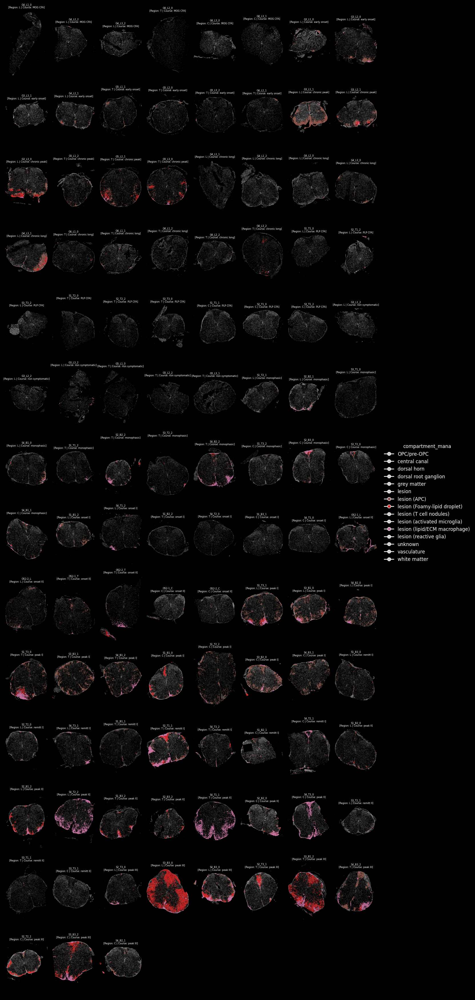

In [101]:
plot_spatial_compact_fast(
    ad,
    color='compartment_mana',
    groupby='sample_id',  # Adjust to your actual sample column
    spot_size = 0.5,
    cols=8,
    height=30,
    background='black',
    dpi=120,
    highlight = ['lesion (lipid/ECM macrophage)','lesion (Foamy-lipid droplet)','lesion (APC)'],
)

In [102]:
ad.write('/Volumes/processing2/RRmap/data/EAE_MANA_annotated_gmm_clust_with_scores_anno_comp.h5ad')